Mohammad Matin Momeni --------- 400243072


Mohammad Sobhan Saririan --------- 400243049

#   Q2 & Q3 are in this noteBook     

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

In [2]:
def openImage(filename):
    path = os.getcwd() + '/project-files/images/'
    image = cv2.imread(path + filename, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    if image.shape[2] == 4:
        image = image[:,:,:3]
    return image

In [3]:
def transformToImage(imageArray):
    size = len(imageArray[0])
    size2 = len(imageArray[0][0])
    image = np.zeros((size, size2, len(imageArray)))
    for i in range(size):
        for j in range(size2):
            for k in range(len(imageArray)):
                image[i][j][k] = imageArray[k][i][j]
    return image

In [4]:
def plot_image(array ,x_size , y_size , image = None ):
    plt.figure(figsize=(x_size, y_size))
    shift = 1
    if image is not None:
        shift = 2
        plt.subplot(1, array.shape[2] + 1, 1)
        plt.imshow(image)

    for i in range(len(array[0][0])):
        plt.subplot(1, array.shape[2] + (shift)//2 , i + shift )
        normal_result = ((array[:,:,i] - array[:,:,i].min()) / (array[:,:,i].max() - array[:,:,i].min())) * 255
        plt.imshow(normal_result.astype(np.uint8), cmap='gray')
    plt.show()

In [5]:
def Conv2D(image, filters, stride , padding):
        H, W , D = image.shape
        output = []
        for i in range(len(filters)):
            filter = filters[i]
            if padding == "same":
                output.append(np.zeros((H, W)))
            else:
                output.append(np.zeros((H - len(filter) + 1, W - len(filter) + 1)))
            for j in range(D):
                channel = image[:,:,j]
                if padding == "same":
                    padLen = (len(filter) - 1) // 2
                    channel = np.pad(channel, ((padLen, padLen), (padLen, padLen)), mode='constant')
                    for k in range(0, H, stride):
                        for l in range(0, W, stride):
                            output[i][k][l] += np.sum(channel[k:k+len(filter), l:l+len(filter)] * filter)
                elif padding == "valid":
                    for k in range(0, H - len(filter) + 1, stride):
                        for l in range(0, W - len(filter) + 1, stride):
                            output[i][k][l] += np.sum(channel[k:k+len(filter), l:l+len(filter)] * filter)
        return transformToImage(output)

In [6]:
def MaxPooling2D(image, window, stride):
    H, W, D = image.shape
    output = []
    for i in range(D):
        channel = image[:,:,i]
        output.append(np.zeros((H // stride, W // stride)))
        for j in range(0, H - window[0] + 1, stride):
            for k in range(0, W - window[1] + 1, stride):
                output[i][j // stride][k // stride] = np.max(channel[j:j+window[0], k:k+window[1]])
    return transformToImage(output)

In [7]:
bottom_sobel = [[-1,-2,-1],
                [0, 0, 0],
                [1, 2, 1]]

top_sobel =[[1, 2, 1],
            [0, 0, 0],
            [-1,-2,-1]]

sharpening =    [[0,-1,0],
                [-1,5,-1],
                [0,-1,0]]

weighted_averaging_3x3 =   [[1, 2, 1],
                            [2, 4, 2],
                            [1, 2, 1]]
for i in range(len(weighted_averaging_3x3)):
    for j in range(len(weighted_averaging_3x3)):
        weighted_averaging_3x3[i][j] /= 16

levelOneFilters =  [bottom_sobel, top_sobel, sharpening, weighted_averaging_3x3]

robert_x = [[1, 0],
            [0, -1]]    

robert_y = [[0, +1],
            [-1, 0]] 

averaging_2x2 = np.ones((2,2)).tolist()
for i in range(len(averaging_2x2)):
    for j in range(len(averaging_2x2)):
        averaging_2x2[i][j] /= 4

levelTwoFilters = [robert_x, robert_y, averaging_2x2]

gaussian_5x5 = [[1,4,7,4,1],
                [4,16,26,16,4],
                [7,26,41,26,7],
                [4,16,26,16,4],
                [1,4,7,4,1]]
for i in range(len(gaussian_5x5)):
    for j in range(len(gaussian_5x5)):
        gaussian_5x5[i][j] /= 273


averaging_5x5 = np.ones((5,5)).tolist()
for i in range(len(averaging_5x5)):
    for j in range(len(averaging_5x5)):
        averaging_5x5[i][j] /= 25

levelThreeFilters = [gaussian_5x5, averaging_5x5]

In [8]:
image1 = openImage('goodfellow.png')
image2 = openImage('bengio.jpg')
image3 = openImage('hinton.jpg')
image4 = openImage('lecun.jpg')

<!-- # layer 0 => blue
# layer 1 => green
# layer 2 => red
# layer 3 => transparency -->

In [9]:
levelOneOutput1 = Conv2D(image1, levelOneFilters, stride=1, padding='same')
levelOneOutput2 = Conv2D(image2, levelOneFilters, stride=1, padding='same')
levelOneOutput3 = Conv2D(image3, levelOneFilters, stride=1, padding='same')
levelOneOutput4 = Conv2D(image4, levelOneFilters, stride=1, padding='same')

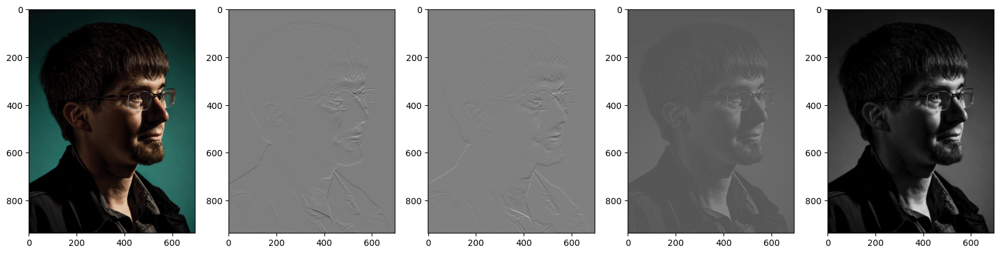

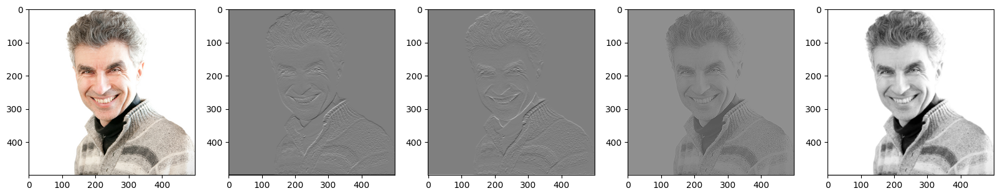

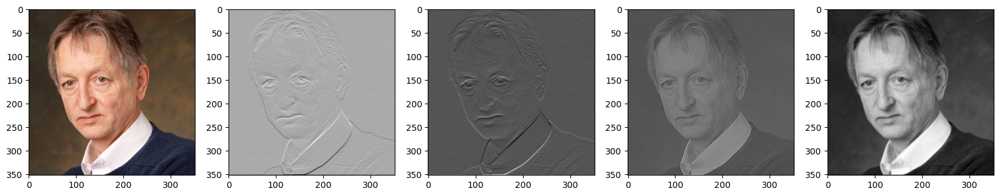

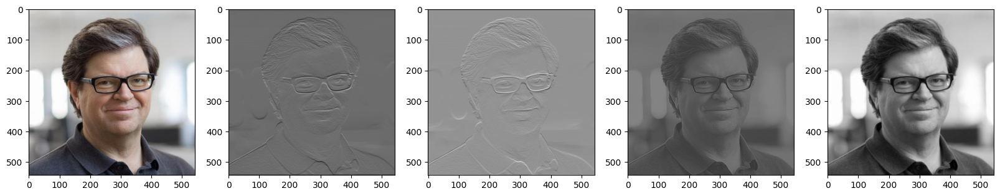

In [10]:
plot_image( levelOneOutput1,20,20, image1 )
plot_image( levelOneOutput2,20,20, image2 )
plot_image( levelOneOutput3,20,20, image3 )
plot_image( levelOneOutput4,20,20, image4 )

In [11]:
levelTwoOutput1 = Conv2D(levelOneOutput1, levelTwoFilters, stride=2, padding='valid')
levelTwoOutput2 = Conv2D(levelOneOutput2, levelTwoFilters, stride=2, padding='valid')
levelTwoOutput3 = Conv2D(levelOneOutput3, levelTwoFilters, stride=2, padding='valid')
levelTwoOutput4 = Conv2D(levelOneOutput4, levelTwoFilters, stride=2, padding='valid')

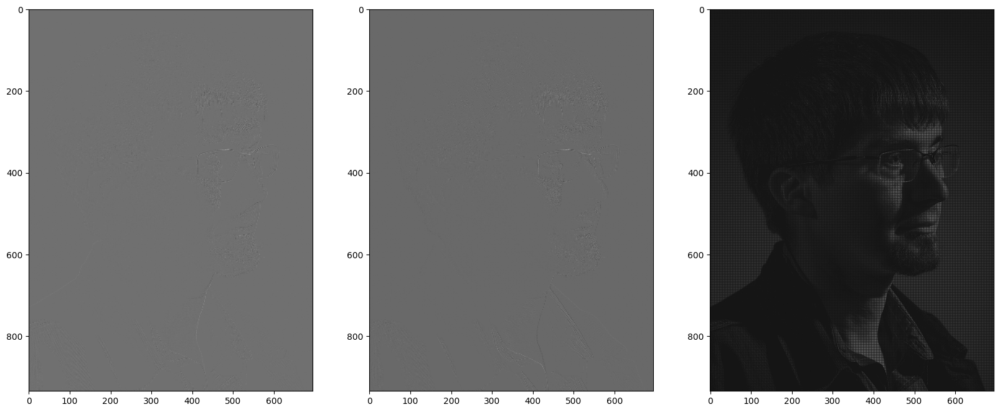

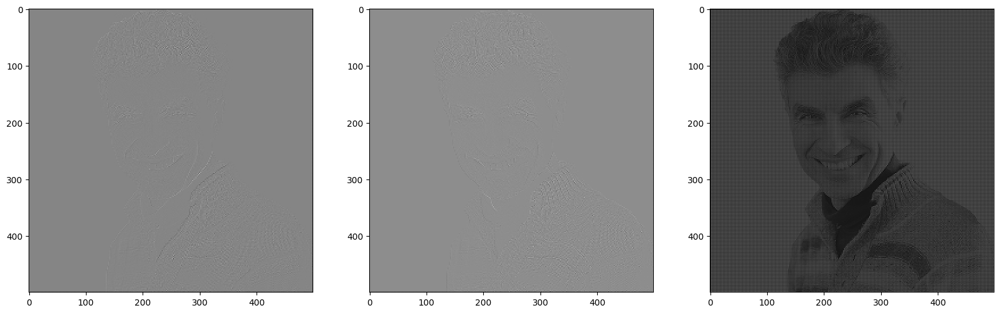

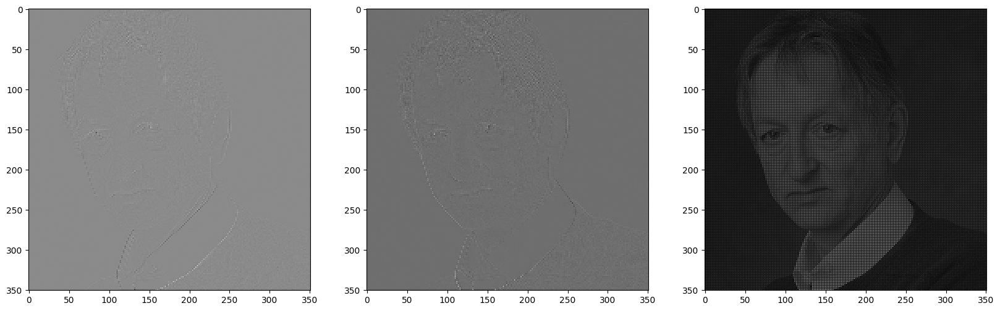

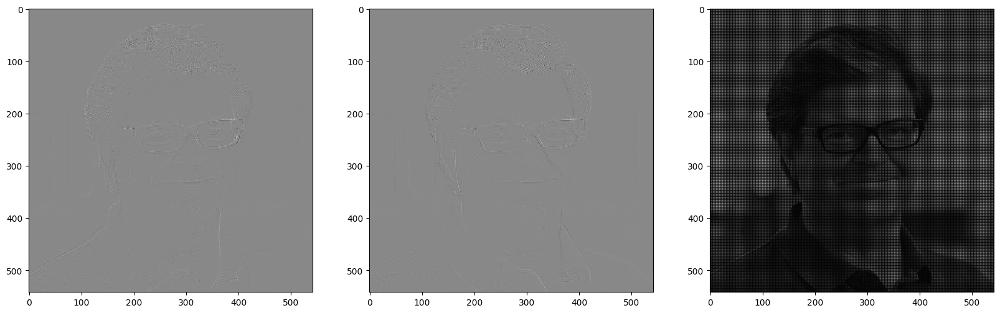

In [12]:
plot_image(levelTwoOutput1,20,20)
plot_image(levelTwoOutput2,20,20)
plot_image(levelTwoOutput3,20,20)
plot_image(levelTwoOutput4,20,20)

In [13]:
levelThreeOutput1 = Conv2D(levelTwoOutput1, levelThreeFilters, stride=1, padding='same')
levelThreeOutput2 = Conv2D(levelTwoOutput2, levelThreeFilters, stride=1, padding='same')
levelThreeOutput3 = Conv2D(levelTwoOutput3, levelThreeFilters, stride=1, padding='same')
levelThreeOutput4 = Conv2D(levelTwoOutput4, levelThreeFilters, stride=1, padding='same')

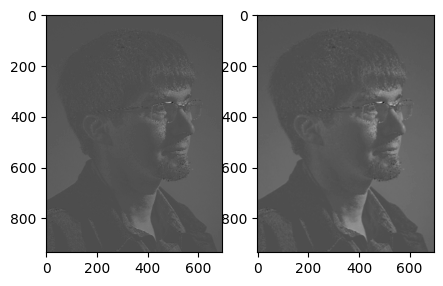

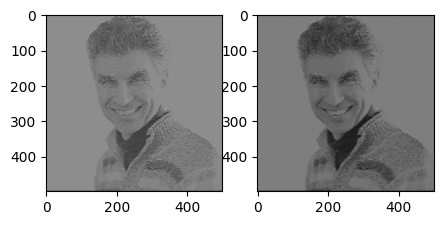

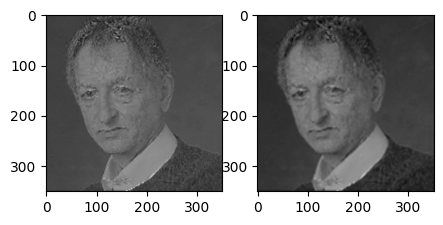

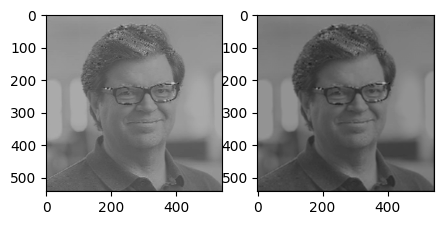

In [14]:
plot_image(levelThreeOutput1,5,5)
plot_image(levelThreeOutput2,5,5)
plot_image(levelThreeOutput3,5,5)
plot_image(levelThreeOutput4,5,5)

In [15]:
poolingOutput1 = MaxPooling2D(levelThreeOutput1, window=(2, 2), stride=2)
poolingOutput2 = MaxPooling2D(levelThreeOutput2, window=(2, 2), stride=2)
poolingOutput3 = MaxPooling2D(levelThreeOutput3, window=(2, 2), stride=2)
poolingOutput4 = MaxPooling2D(levelThreeOutput4, window=(2, 2), stride=2)

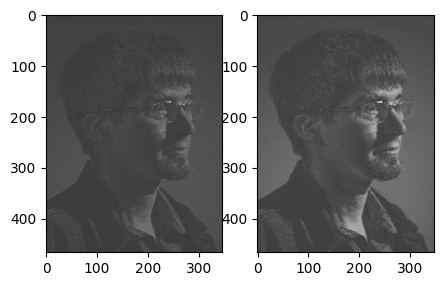

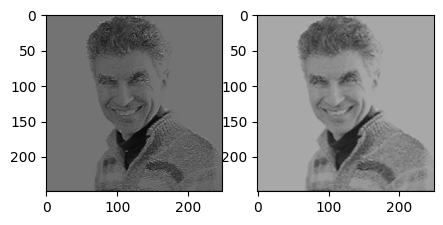

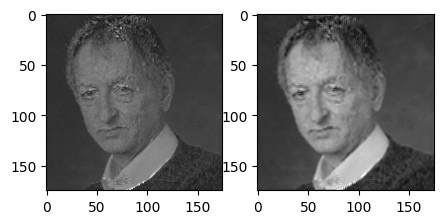

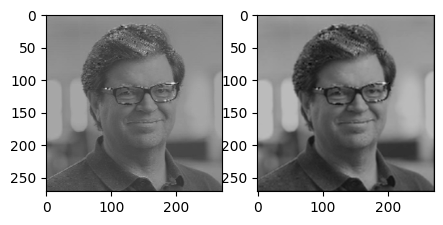

In [16]:
plot_image(poolingOutput1,5,5)
plot_image(poolingOutput2,5,5)
plot_image(poolingOutput3,5,5)
plot_image(poolingOutput4,5,5)

Q3

In [17]:
def Freq_Phase(image):
    fft = np.fft.fft2(image)
    freq = np.fft.fftshift(fft)
    phase = np.angle(freq)
    return freq, phase

In [18]:
def Plot_Frequency(image , Frequency , Phase ):
    plt.figure(num=None, figsize=(16, 6), dpi=80)
    plt.subplot(1, 3, 1)
    plt.imshow(image , cmap='gray')
    plt.subplot(1, 3, 2)
    plt.imshow(np.log(abs(Frequency)), cmap='gray')
    plt.subplot(1, 3, 3)
    plt.imshow(Phase, cmap='gray')
    plt.show()

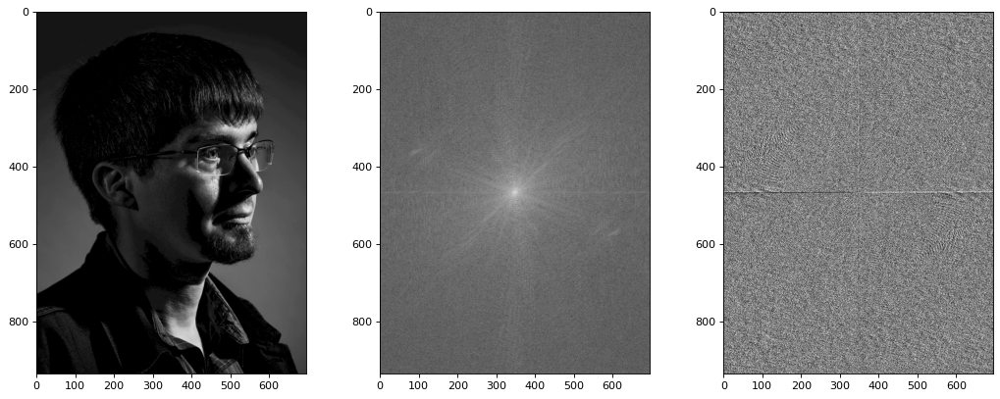

In [19]:
image = cv2.imread('project-files/images/goodfellow.png', cv2.IMREAD_GRAYSCALE)
Freq , Phase = Freq_Phase(image)
Plot_Frequency(image , Freq ,Phase)

: به عنوان نمونه 
با توجه به عکس اصلی و تبدیل فوریه آن و مقایسه آن با دو فیلتر تشخیص لبه  ، می توانیم بگوییم که با اعمال این فیلتر 
.ها فرکانس های بالاتر ، تشدید شده و باعث می شود ، لبه ها مشخص شوند

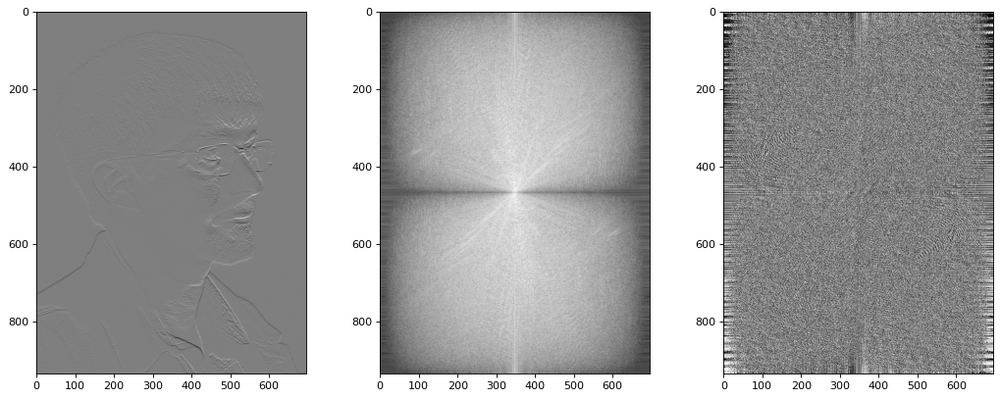

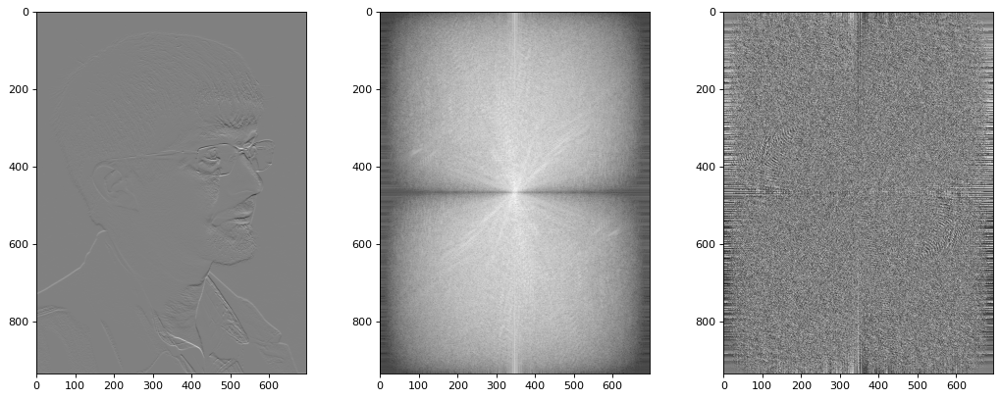

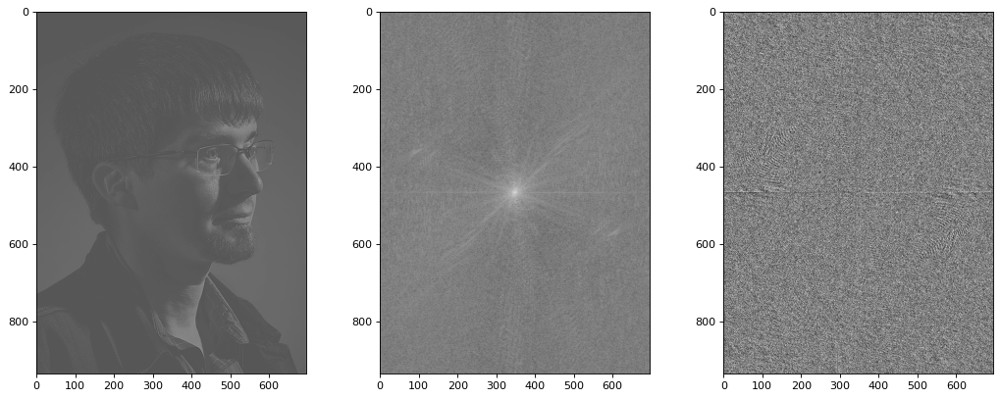

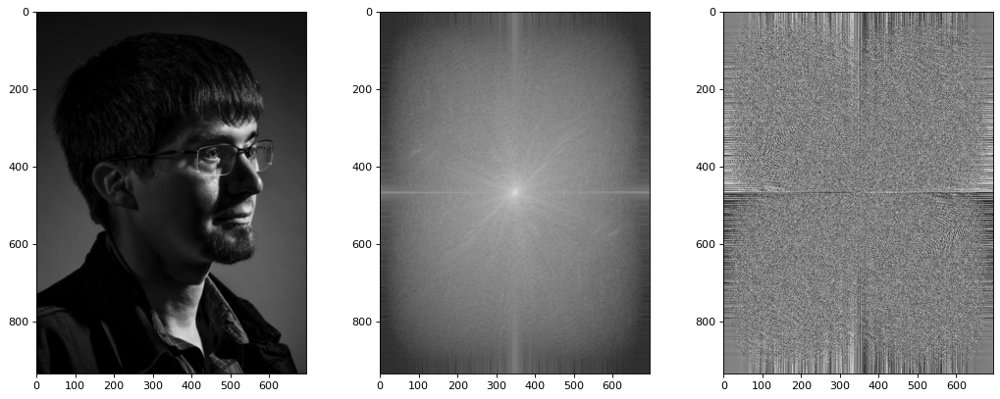

In [20]:
lOO1_F1 , lOO1_P1 = Freq_Phase(levelOneOutput1[:,:,0])
lOO1_F2 , lOO1_P2 = Freq_Phase(levelOneOutput1[:,:,1])
lOO1_F3 , lOO1_P3 = Freq_Phase(levelOneOutput1[:,:,2])
lOO1_F4 , lOO1_P4 = Freq_Phase(levelOneOutput1[:,:,3])

Plot_Frequency(levelOneOutput1[:,:,0] , lOO1_F1 , lOO1_P1)
Plot_Frequency(levelOneOutput1[:,:,1] , lOO1_F2 , lOO1_P2)
Plot_Frequency(levelOneOutput1[:,:,2] , lOO1_F3 , lOO1_P3)
Plot_Frequency(levelOneOutput1[:,:,3] , lOO1_F4 , lOO1_P4)


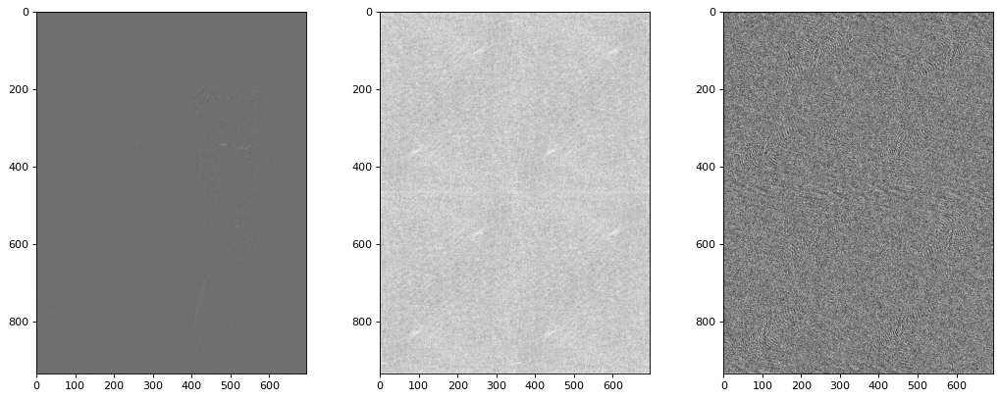

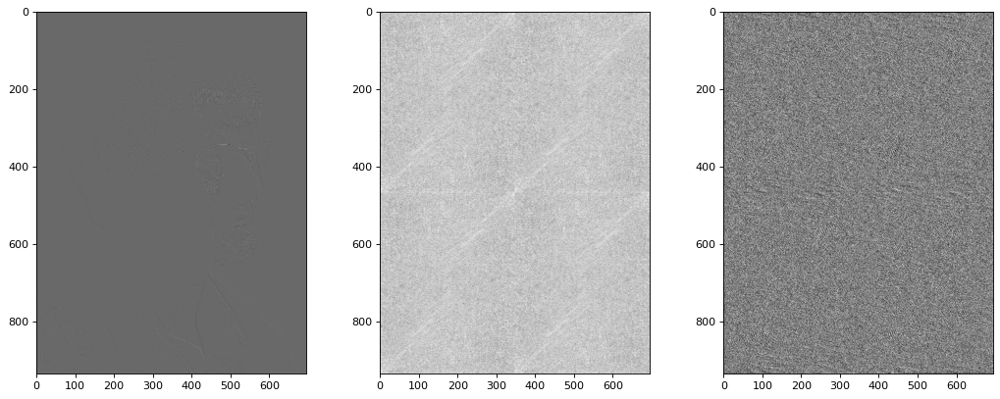

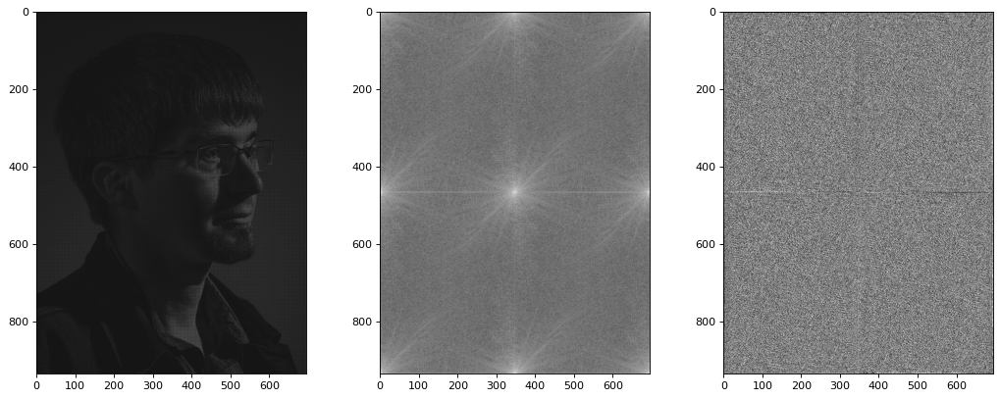

In [21]:
lTO1_F1 , lTO1_P1 = Freq_Phase(levelTwoOutput1[:,:,0])
lTO1_F2 , lTO1_P2 = Freq_Phase(levelTwoOutput1[:,:,1])
lTO1_F3 , lTO1_P3 = Freq_Phase(levelTwoOutput1[:,:,2])

Plot_Frequency(levelTwoOutput1[:,:,0] , lTO1_F1 , lTO1_P1)
Plot_Frequency(levelTwoOutput1[:,:,1] , lTO1_F2 , lTO1_P2)
Plot_Frequency(levelTwoOutput1[:,:,2] , lTO1_F3 , lTO1_P3)

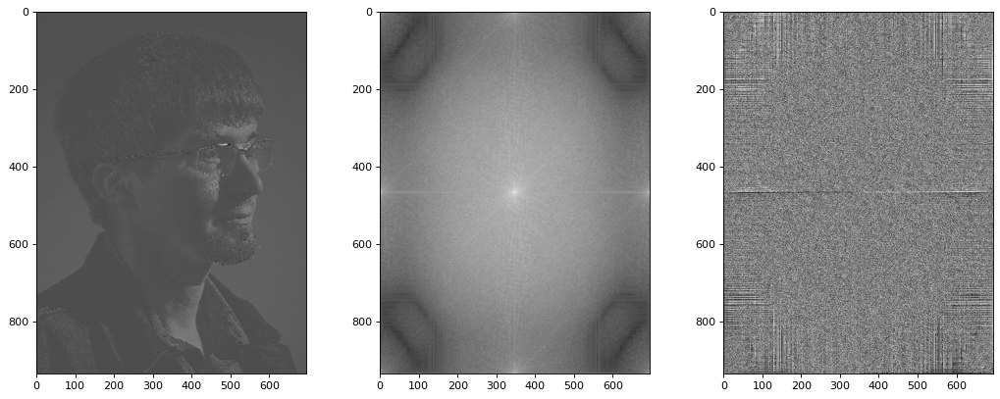

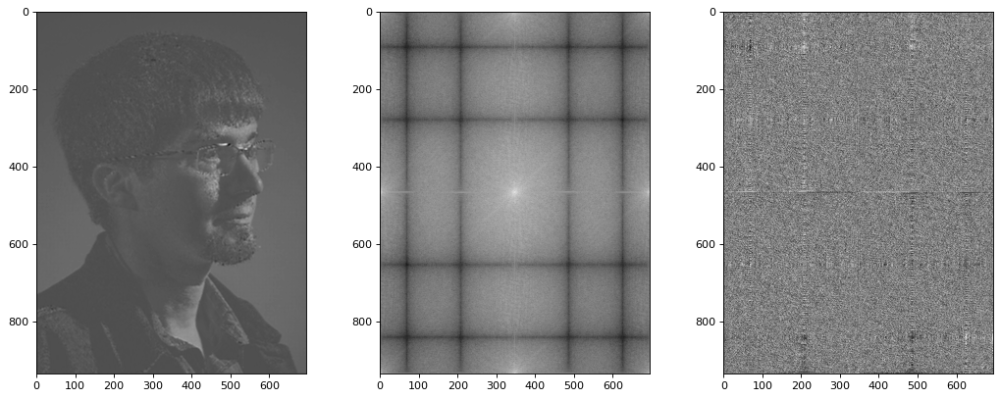

In [22]:
LThO1_F1 , LThO1_P1 = Freq_Phase(levelThreeOutput1[:,:,0])
LThO1_F2 , LThO1_P2 = Freq_Phase(levelThreeOutput1[:,:,1])

Plot_Frequency(levelThreeOutput1[:,:,0] , LThO1_F1 , LThO1_P1)
Plot_Frequency(levelThreeOutput1[:,:,1] , LThO1_F2 , LThO1_P2)

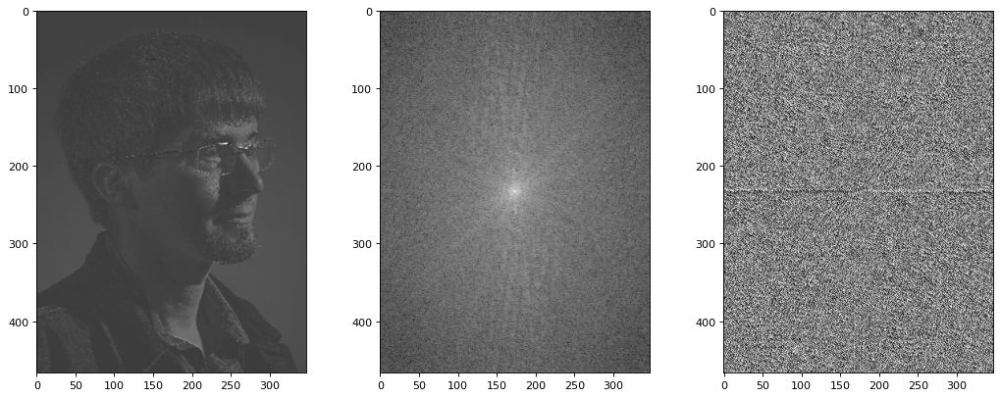

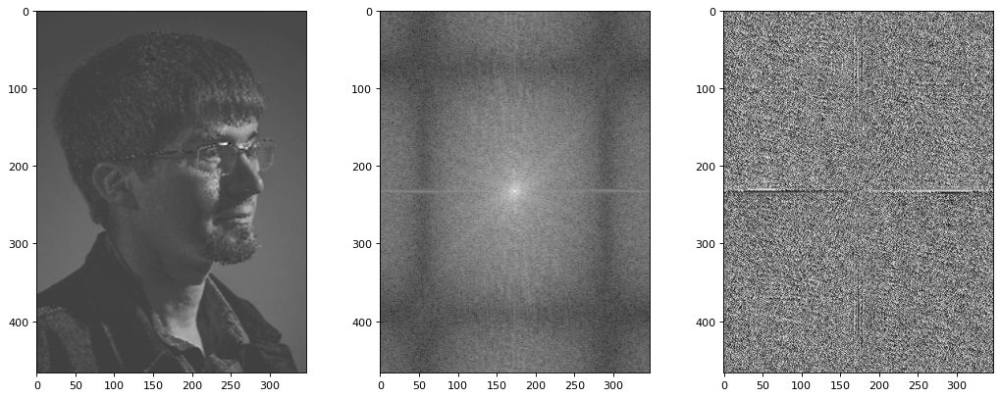

In [23]:
PO1_F1 , PO1_P1 = Freq_Phase(poolingOutput1[:,:,0])
PO1_F2 , PO1_P2 = Freq_Phase(poolingOutput1[:,:,1])

Plot_Frequency(poolingOutput1[:,:,0] , PO1_F1 , PO1_P1)
Plot_Frequency(poolingOutput1[:,:,1] , PO1_F2 , PO1_P2)

In [24]:
def Low_Pass_Filter(image , cut_off):
    image1_np=np.array(image)
    
    fft1 = np.fft.fftshift(np.fft.fft2(image1_np))

    x,y = image1_np.shape[0],image1_np.shape[1]
    e_x,e_y=cut_off,cut_off
    bbox=((x//2)-(e_x//2),(y//2)-(e_y//2),(x//2)+(e_x//2),(y//2)+(e_y//2))
    low_pass_np = np.zeros((x,y))   
    low_pass_np[bbox[0]:bbox[2], bbox[1]:bbox[3]] = 1
    
    return low_pass_np*fft1
def High_Pass_Filter(image, cut_off):
    image1_np=np.array(image)
    
    fft1 = np.fft.fftshift(np.fft.fft2(image1_np))

    x,y = image1_np.shape[0],image1_np.shape[1]
    e_x,e_y=cut_off,cut_off
    bbox=((x//2)-(e_x//2),(y//2)-(e_y//2),(x//2)+(e_x//2),(y//2)+(e_y//2))
    high_pass_np = np.ones((x,y))
    high_pass_np[bbox[0]:bbox[2], bbox[1]:bbox[3]] = 0
    return high_pass_np*fft1

def Inverse_Fourier_Transform(Filtered):
    Inverse_FFT = np.real(np.fft.ifft2(np.fft.ifftshift(Filtered)))
    Inverse_FFT = np.maximum(0, np.minimum(Inverse_FFT, 255))
    return Inverse_FFT

In [25]:
def Perform_Filter(image , cut_off):
    Low_filtered= Low_Pass_Filter(image , cut_off)
    high_filtered= High_Pass_Filter(image , cut_off)

    Inverse_FFT_LowFiltered = Inverse_Fourier_Transform(Low_filtered)
    Inverse_FFT_HighFiltered = Inverse_Fourier_Transform(high_filtered)
    return Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered

def Plot_Filtered(image , LowFiltered , HighFiltered):
    plt.figure(num=None, figsize=(16, 6), dpi=80)
    plt.subplot(1, 3, 1)
    plt.imshow(image , cmap='gray')
    plt.subplot(1, 3, 2)
    plt.imshow(LowFiltered, cmap='gray')
    plt.subplot(1, 3, 3)
    plt.imshow(HighFiltered, cmap='gray')
    plt.show()

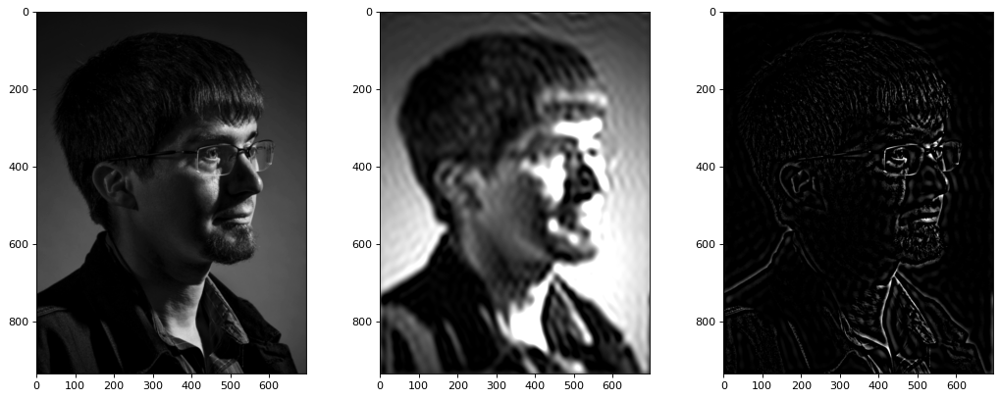

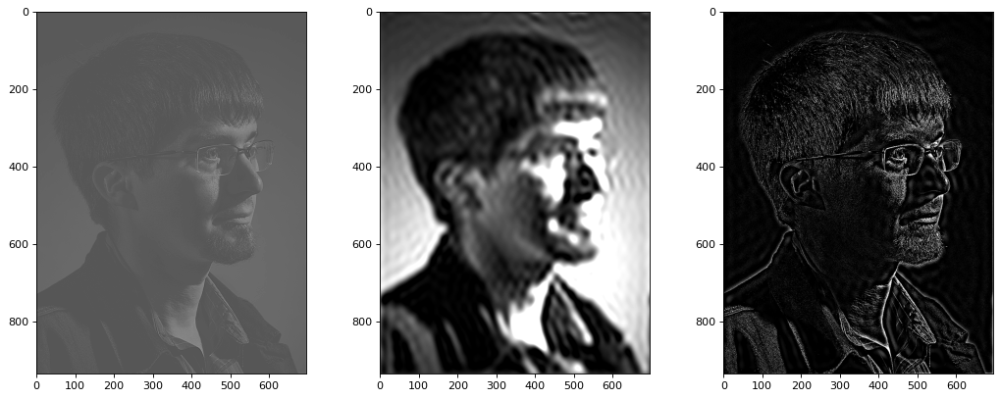

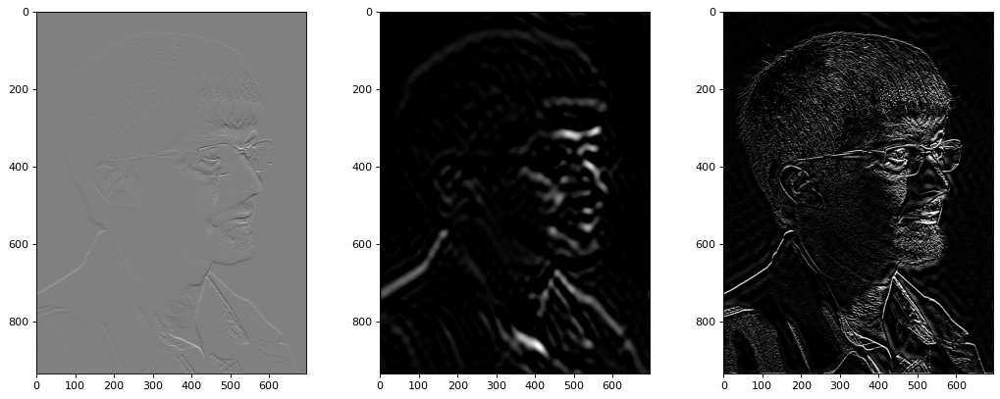

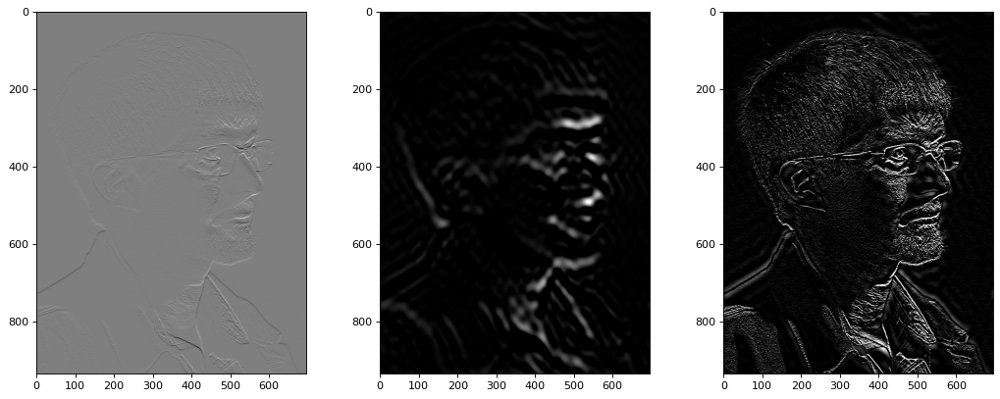

In [26]:
Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered = Perform_Filter(levelOneOutput1[:,:,3] , 50)
Plot_Filtered(levelOneOutput1[:,:,3] , Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered)

Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered = Perform_Filter(levelOneOutput1[:,:,2] , 50)
Plot_Filtered(levelOneOutput1[:,:,2] , Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered)

Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered = Perform_Filter(levelOneOutput1[:,:,1] , 50)
Plot_Filtered(levelOneOutput1[:,:,1] , Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered)

Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered = Perform_Filter(levelOneOutput1[:,:,0] , 50)
Plot_Filtered(levelOneOutput1[:,:,0] , Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered)

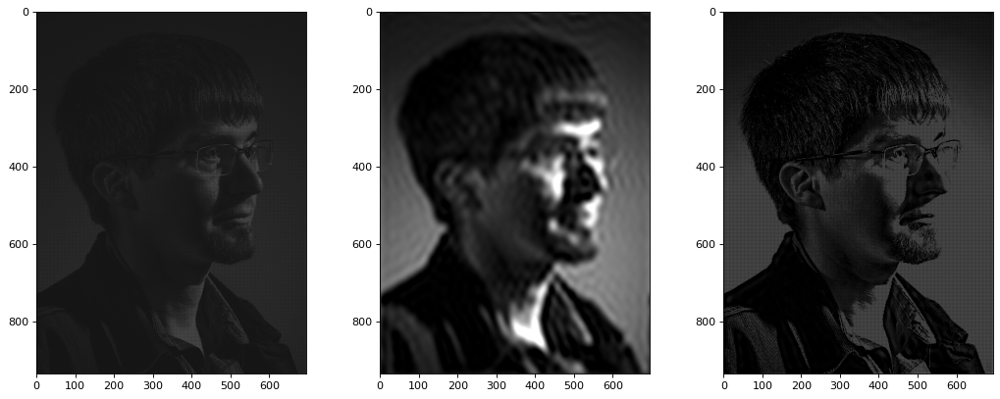

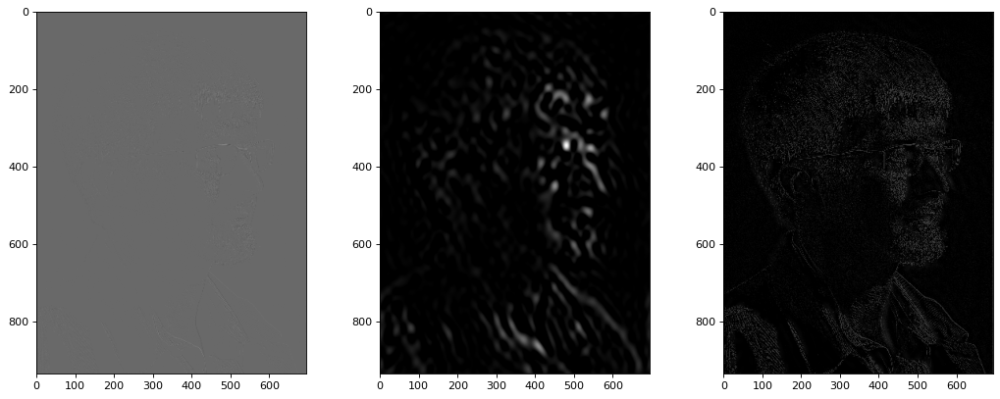

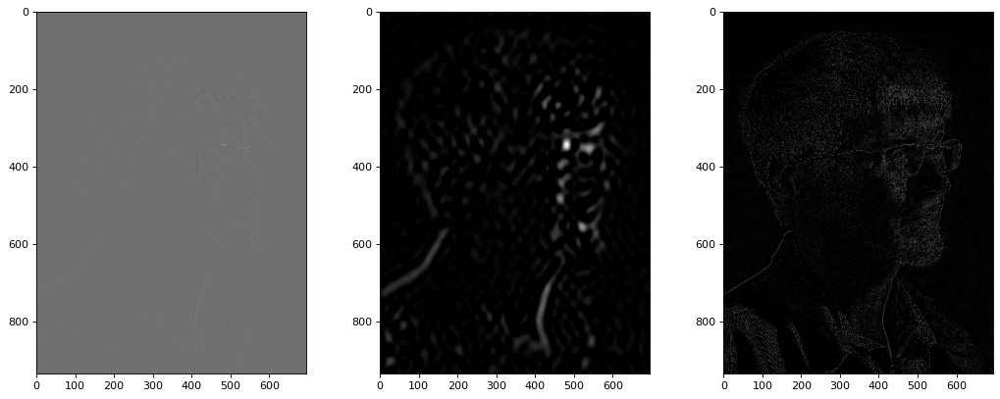

In [27]:
Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered = Perform_Filter(levelTwoOutput1[:,:,2] , 50)
Plot_Filtered(levelTwoOutput1[:,:,2] , Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered)

Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered = Perform_Filter(levelTwoOutput1[:,:,1] , 50)
Plot_Filtered(levelTwoOutput1[:,:,1] , Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered)

Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered = Perform_Filter(levelTwoOutput1[:,:,0] , 50)
Plot_Filtered(levelTwoOutput1[:,:,0] , Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered)


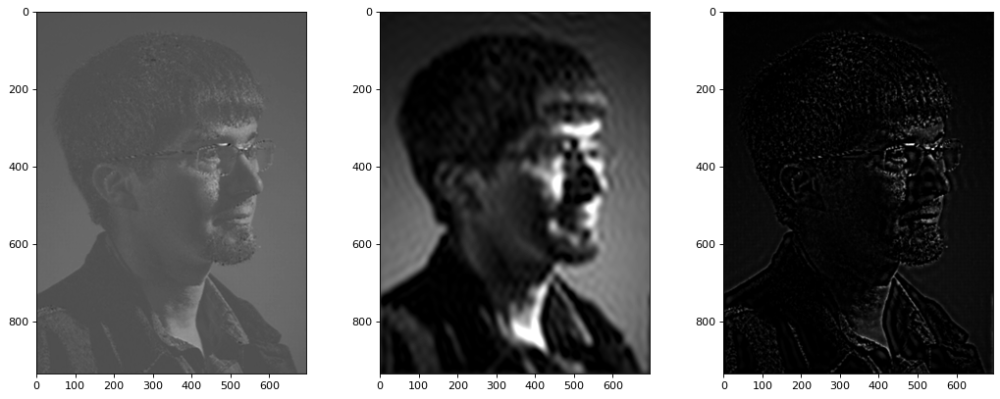

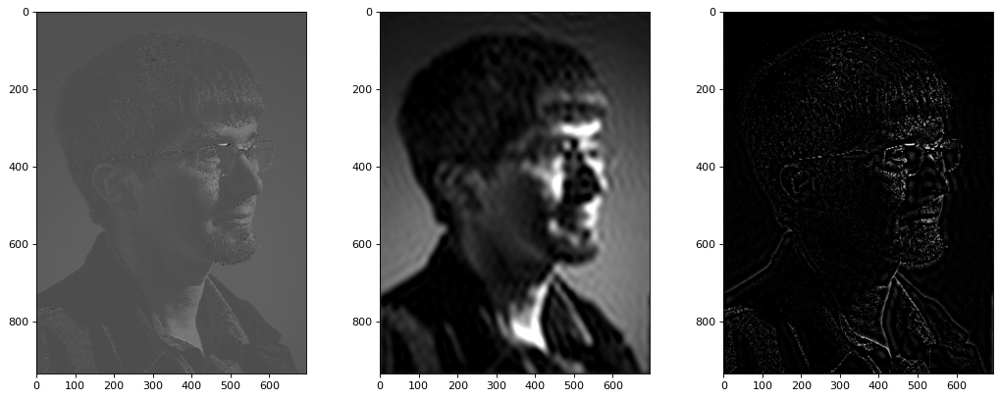

In [28]:
Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered = Perform_Filter(levelThreeOutput1[:,:,1] , 50)
Plot_Filtered(levelThreeOutput1[:,:,1] , Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered)

Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered = Perform_Filter(levelThreeOutput1[:,:,0] , 50)
Plot_Filtered(levelThreeOutput1[:,:,0] , Inverse_FFT_LowFiltered , Inverse_FFT_HighFiltered)
